In [1]:
from google.colab import files
uploaded = files.upload()

Saving football_f1_01.png to football_f1_01.png
Saving football_f1_02.png to football_f1_02.png
Saving football_f2_01.png to football_f2_01.png
Saving football_f2_02.png to football_f2_02.png
Saving football_f3_01.png to football_f3_01.png
Saving football_f3_02.png to football_f3_02.png


In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [4]:


def bit_slicing (image):
# Read the image in greyscale
  image = cv2.imread(image, 0)

  width = image.shape[0]
  height = image.shape[1]

  bit_mask = [1,2,4,8,16,32,64,128]
  bit_sclice=[]
  #Iterate over each pixel and change pixel value to binary using np.binary_repr() and store it in a list.
  lst = []
  bit_img=[]
  for i in range(image.shape[0]):
      for j in range(image.shape[1]):
          lst.append(np.binary_repr(image[i][j] ,width=8)) # width = no. of bits
  

  # We have a list of strings where each string represents binary pixel value. To extract bit planes we need to iterate over the strings and store the characters corresponding to bit planes into lists.
  # Multiply with 2^(n-1) and reshape to reconstruct the bit image.
  for i in range(8):
    bit_sclice.append((np.array([int(pixel[7-i]) for pixel in lst],dtype = np.uint8) * bit_mask[i]).reshape(image.shape[0],image.shape[1]))
    bit_img.append(cv2.cvtColor(bit_sclice[i], cv2.COLOR_BGR2RGB))
  return bit_sclice, bit_img
 



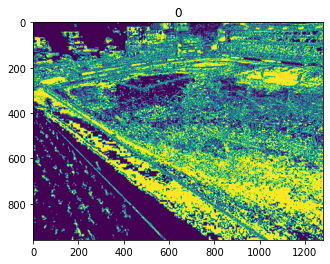

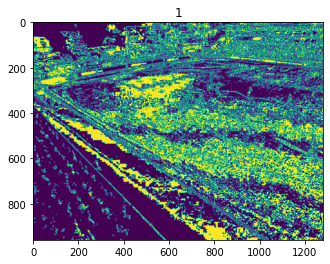

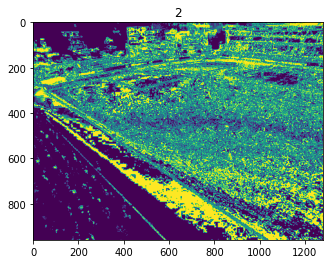

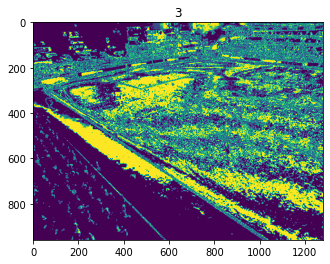

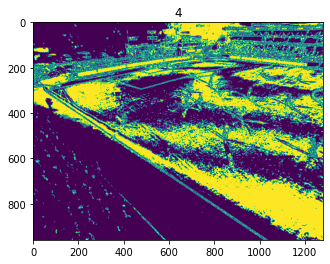

...

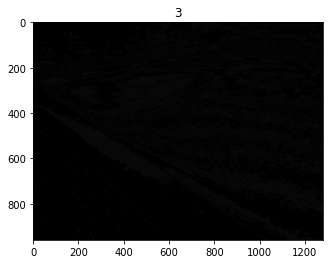

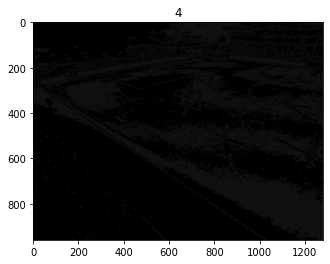

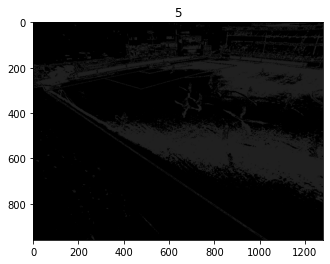

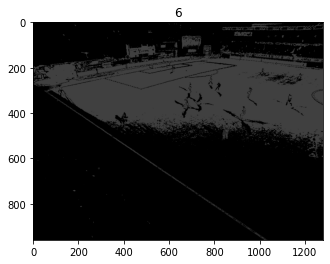

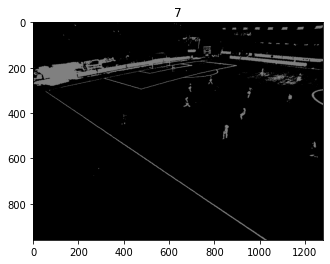

In [5]:
count1=0
count=0
football_f1_01 , bit_football_f1_01= bit_slicing("football_f1_01.png")
for i in football_f1_01:
  
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1
for i in bit_football_f1_01:
  
  plt.imshow(i), plt.title(count1)
  plt.show()
  count1 +=1

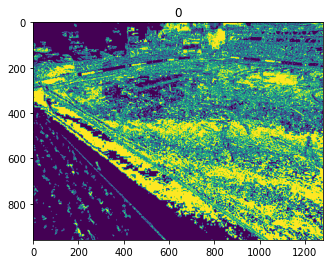

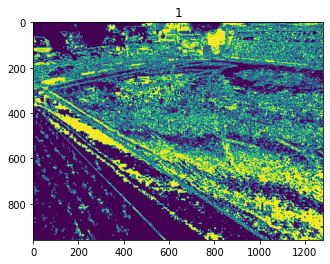

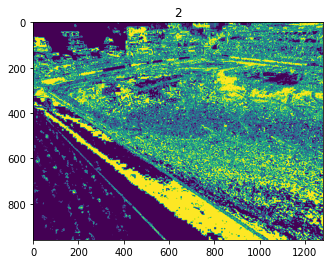

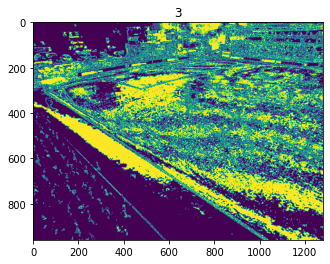

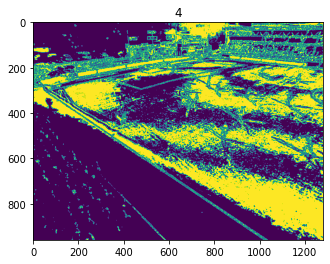

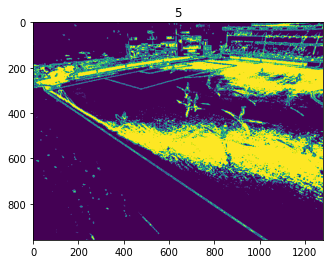

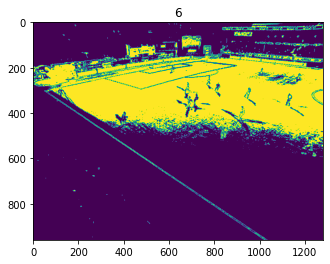

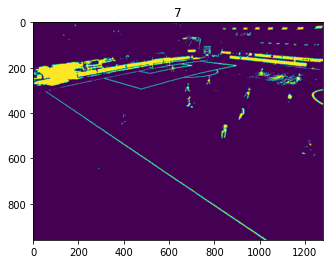

In [6]:
count=0
football_f1_02, bit_football_f1_02= bit_slicing("football_f1_02.png")
for i in football_f1_02:
  
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

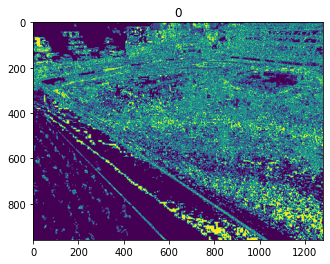

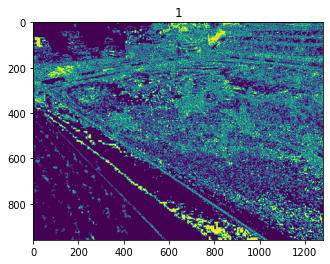

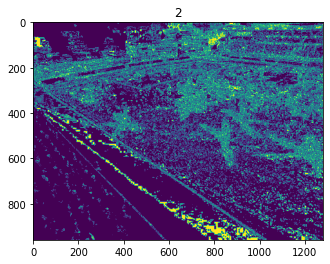

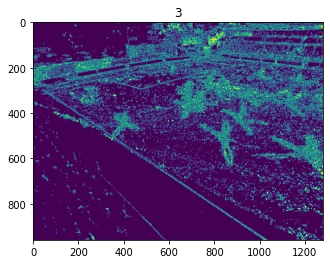

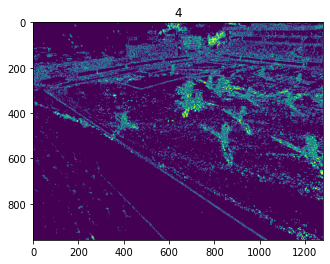

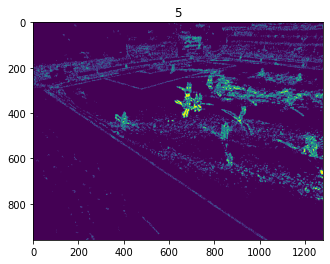

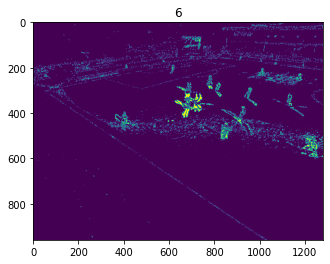

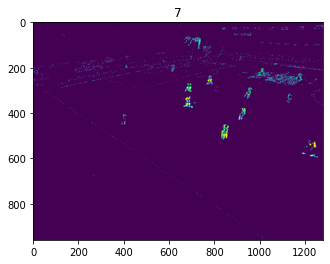

In [7]:
frame1=[]
count=0
for i in range(8):
  frame1.append(cv2.bitwise_xor(football_f1_01[i], football_f1_02[i]))
for i in frame1:
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

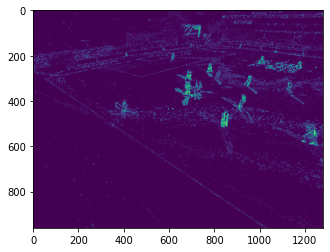

In [8]:
image_recreate1 = np.zeros(np.array(football_f1_02[1]).shape) 
for idx in [4,5,6,7]:
    image_recreate1 = image_recreate1 + frame1[idx] 
plt.imshow(image_recreate1)
plt.show()

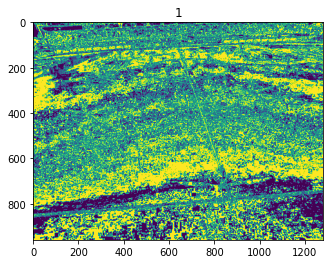

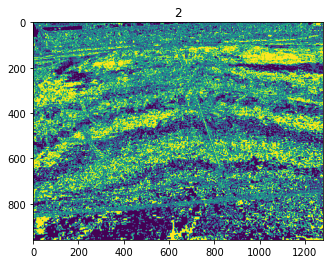

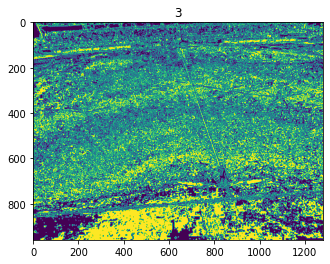

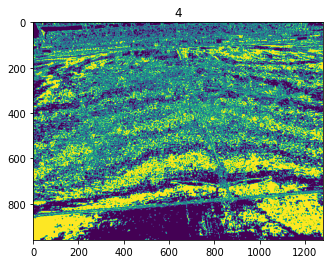

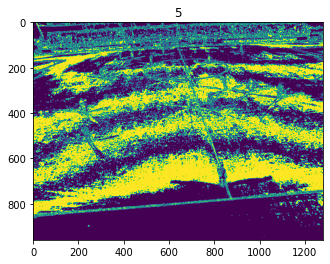

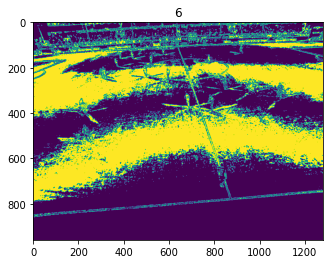

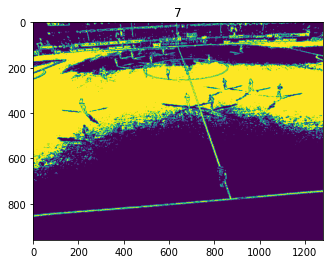

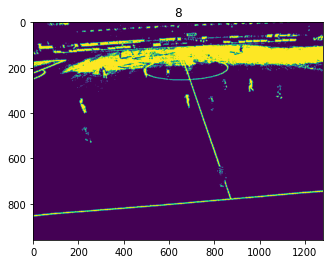

In [9]:
count=1
football_f2_01,bit_football_f2_01= bit_slicing("football_f2_01.png")
for i in football_f2_01:
  
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

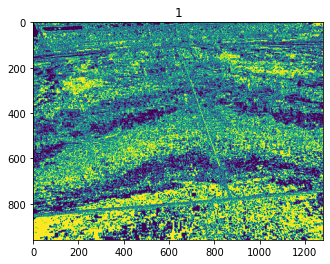

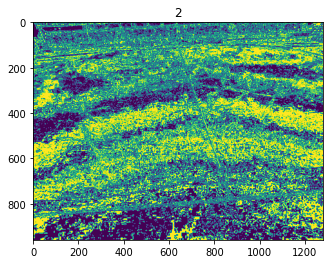

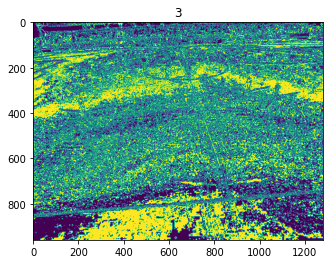

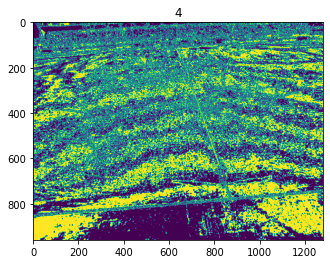

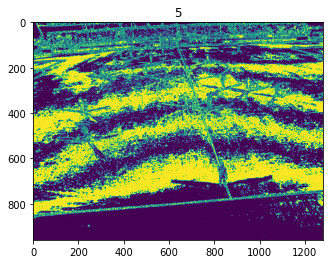

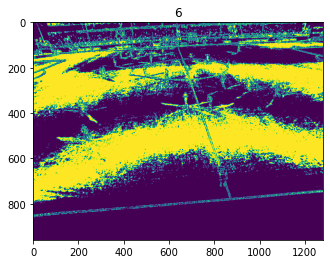

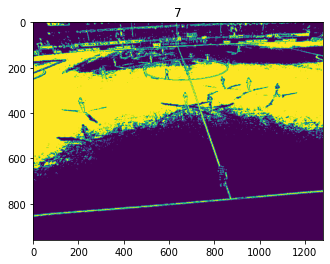

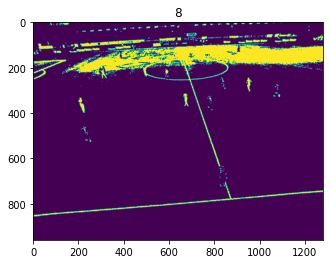

In [10]:
count=1
football_f2_02, bit_football_f2_02= bit_slicing("football_f2_02.png")
for i in football_f2_02:
  
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

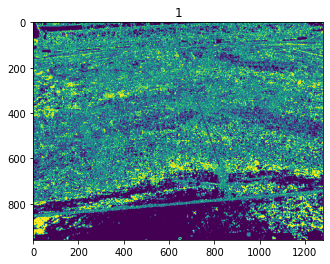

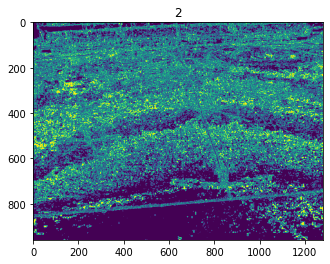

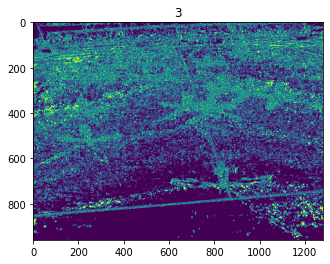

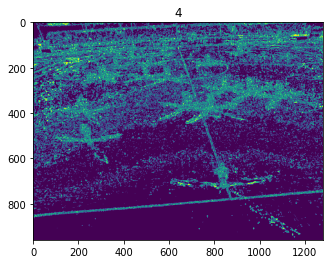

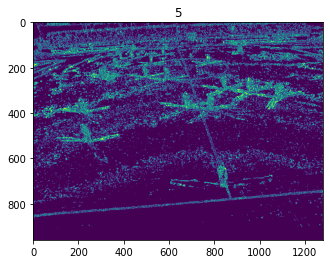

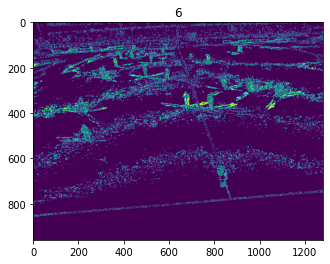

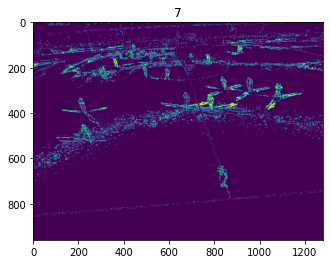

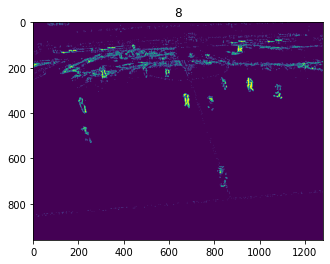

In [11]:
frame2=[]
count=1
for i in range(8):
  frame2.append(cv2.bitwise_xor(football_f2_01[i], football_f2_02[i]))
for i in frame2:
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

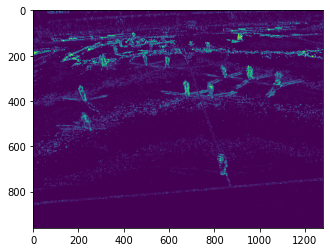

In [12]:
image_recreate2 = np.zeros(np.array(football_f2_02[1]).shape) 
for idx in [4,5,6,7]:
    image_recreate2 = image_recreate2 + frame2[idx] 
plt.imshow(image_recreate2)
plt.show()

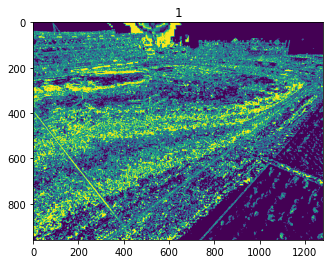

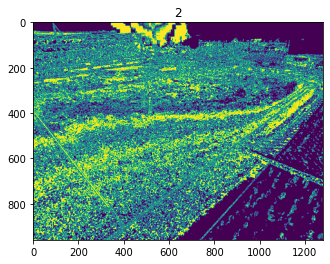

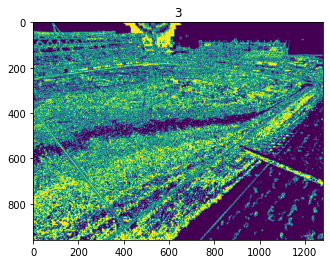

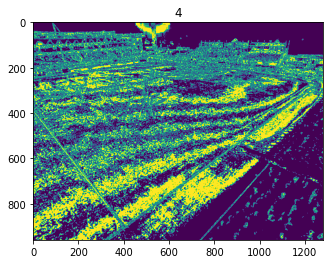

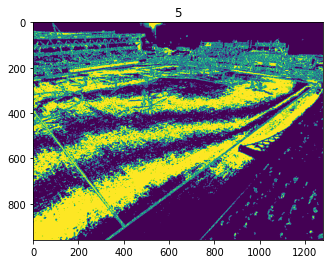

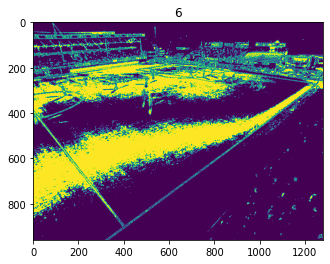

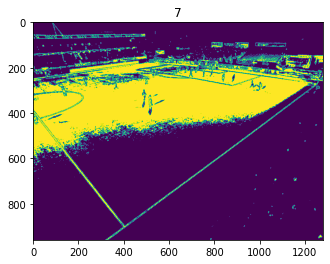

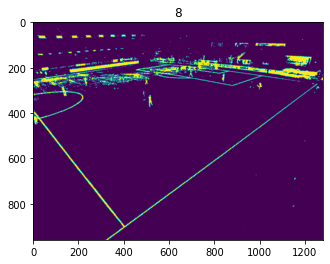

In [13]:
count=1
football_f3_01, bit_football_f3_01= bit_slicing("football_f3_01.png")
for i in football_f3_01:
  
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

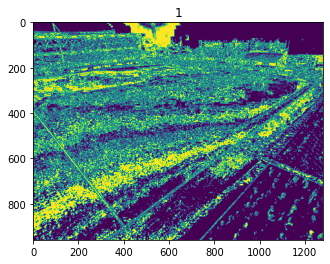

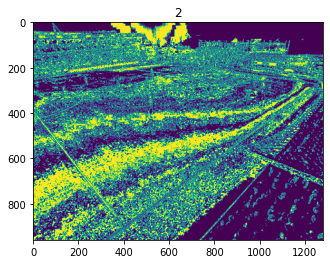

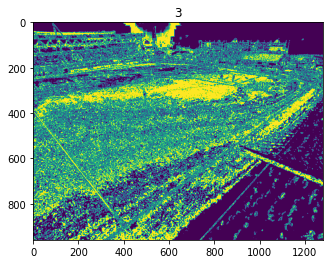

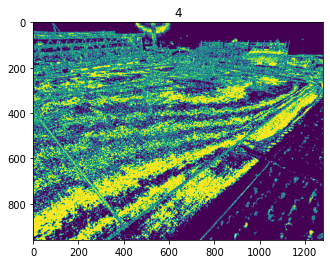

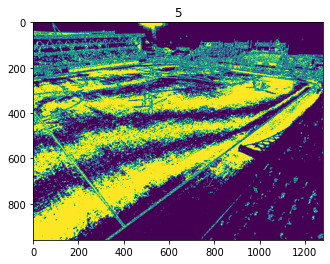

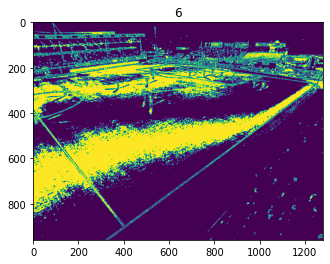

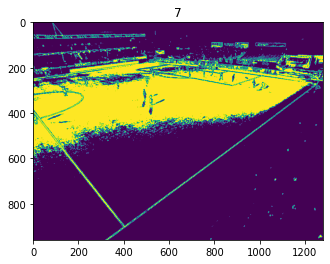

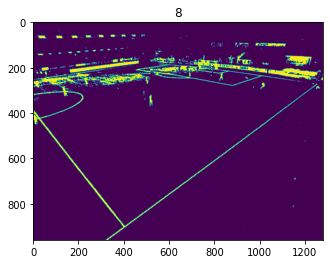

In [14]:
count=1
football_f3_02, bit_football_f3_02= bit_slicing("football_f3_02.png")
for i in football_f3_02:
  
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

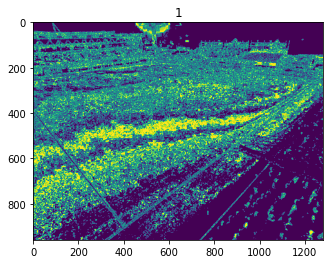

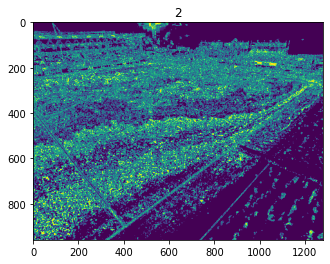

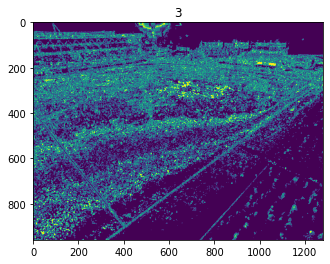

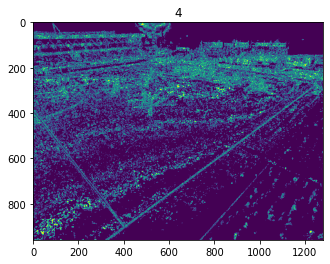

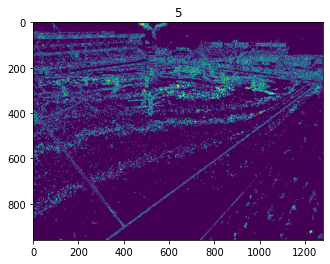

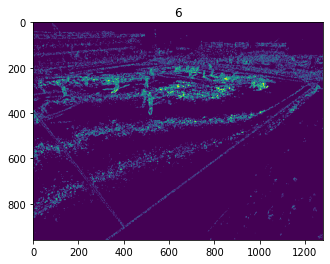

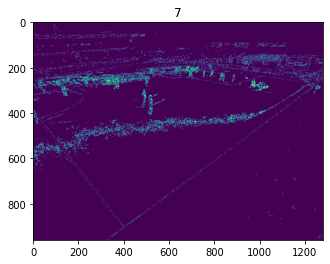

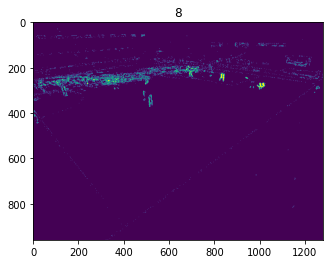

In [15]:
frame3=[]
count=1
for i in range(8):
  frame3.append(cv2.bitwise_xor(football_f3_01[i], football_f3_02[i]))
for i in frame3:
  plt.imshow(i), plt.title(count)
  plt.show()
  count +=1

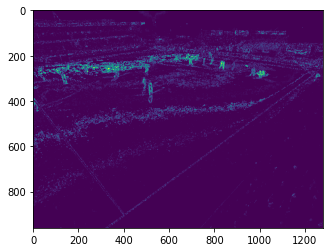

In [16]:
image_recreate3 = np.zeros(np.array(football_f3_02[1]).shape) 
for idx in [4,5,6,7]:
    image_recreate3 = image_recreate3 + frame3[idx] 
plt.imshow(image_recreate3)
plt.show()

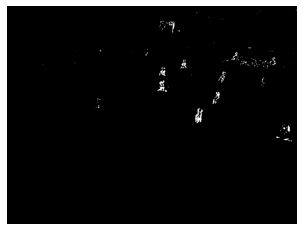

In [19]:
import numpy as np
from PIL import Image, ImageFilter
enhanced = cv2.inRange(image_recreate1, 120, 255)
_, enhanced = cv2.threshold(enhanced, 0, 1, cv2.THRESH_BINARY)
enhanced = Image.fromarray(enhanced).filter(ImageFilter.GaussianBlur)
plt.imshow(enhanced, cmap='gray')
plt.axis('off')
plt.show()

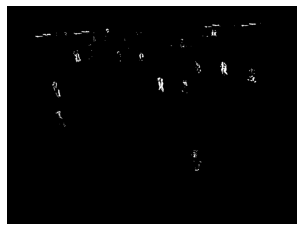

In [31]:
import numpy as np
from PIL import Image, ImageFilter
enhanced = cv2.inRange(image_recreate2, 120, 230)
_, enhanced = cv2.threshold(enhanced, 0, 1, cv2.THRESH_BINARY)
enhanced = Image.fromarray(enhanced).filter(ImageFilter.GaussianBlur)
plt.imshow(enhanced, cmap='gray')
plt.axis('off')
plt.show()

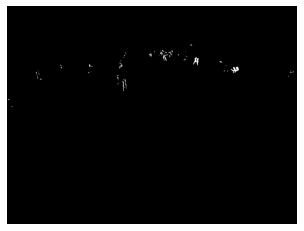

In [30]:
import numpy as np
from PIL import Image, ImageFilter
enhanced = cv2.inRange(image_recreate3, 115, 230)
_, enhanced = cv2.threshold(enhanced, 0, 1, cv2.THRESH_BINARY)
enhanced = Image.fromarray(enhanced).filter(ImageFilter.GaussianBlur)
plt.imshow(enhanced, cmap='gray')
plt.axis('off')
plt.show()